<div style="background-color: #4b3832; padding: 20px; border-radius: 10px; box-shadow: 5px 5px 10px #888888;">
  <h1 style="color: white; font-size: 30px; font-weight: bold; text-align: center; text-shadow: 2px 2px 4px #000000;">Text Data Preprocessing of Twitter Sentiment Analysis Dataset
</h1>
</div>

# Data Collection

In [1]:
import pandas as pd
df = pd.read_csv('twitter.csv')
df.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


# Inspecting the dataset

In [2]:
df.columns

Index(['id', 'label', 'tweet'], dtype='object')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB


In [4]:
df.describe()

,id,label
count,31962.000000,31962.000000
mean,15981.500000,0.070146
std,9226.778988,0.255397
min,1.000000,0.000000
25%,7991.250000,0.000000
50%,15981.500000,0.000000
75%,23971.750000,0.000000
max,31962.000000,1.000000


In [5]:
df.shape

(31962, 3)

# Data Cleaning

In [6]:
df.isnull().sum()

id       0
label    0
tweet    0
dtype: int64

In [7]:
df.duplicated().sum()

0

Since the dataset don't have any null values and duplicate values, it is cleaned and we can proceed with our analysis!

# Data Preprocessing

## Tokenization

In [8]:
# Importing required libraries
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

import pandas as pd
import matplotlib.pyplot as plt
import io
import unicodedata
import numpy as np
import re
import string
import nltk
from nltk.tokenize import sent_tokenize
import nltk
from nltk.tokenize import word_tokenize
import warnings 
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Kowstubha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Kowstubha\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Kowstubha\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Kowstubha\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [9]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
df['tokens'] = df['tweet'].apply(word_tokenize)
print(df[['id', 'label', 'tokens']])
for index, row in df.iterrows():
    print(f"Tweet {row['id']} Tokens: {row['tokens']}")

          id  label                                             tokens
0          1      0  [@, user, when, a, father, is, dysfunctional, ...
1          2      0  [@, user, @, user, thanks, for, #, lyft, credi...
2          3      0                            [bihday, your, majesty]
3          4      0  [#, model, i, love, u, take, with, u, all, the...
4          5      0       [factsguide, :, society, now, #, motivation]
...      ...    ...                                                ...
31957  31958      0  [ate, @, user, isz, that, youuu, ?, ððð...
31958  31959      0  [to, see, nina, turner, on, the, airwaves, try...
31959  31960      0  [listening, to, sad, songs, on, a, monday, mor...
31960  31961      1  [@, user, #, sikh, #, temple, vandalised, in, ...
31961  31962      0            [thank, you, @, user, for, you, follow]

[31962 rows x 3 columns]
Tweet 1 Tokens: ['@', 'user', 'when', 'a', 'father', 'is', 'dysfunctional', 'and', 'is', 'so', 'selfish', 'he', 'drags', '

Tweet 1267 Tokens: ['the', 'time', 'when', 'you', 'sing', '``', 'ole', 'ole', 'ole', '``', '...', 'seeing', 'the', 'rain', 'outside', '#', 'noida', '#', 'delhi', '#', 'rain']
Tweet 1268 Tokens: ['#', 'allsmiles', '#', 'relaxed', 'readyfoheday', '#', 'thankstomyspecialsomeone']
Tweet 1269 Tokens: ['omg', ',', 'hope', 'you', 'had', 'fun', 'seeing', 'selena', 'gomez', 'live', '.', 'if', 'you', 'went', '.', 'sorry', 'if', 'you', 'did', "n't", 'go', '.']
Tweet 1270 Tokens: ['#', 'father', "'s", 'day', '!', 'these', 'dog-dads', 'really', 'know', 'how', 'to', 'show', 'some', '#', 'spirit', 'for', 'their', 'best', '#', 'friends', '.', '#', 'dogs']
Tweet 1271 Tokens: ['soon', 'it', 'seems', '``', 'all', "''", 'food', 'will', 'be', '#', 'gmo', 'if', 'they', 'do', "n't", '#', 'labelit', 'how', 'do', 'you', 'keep', 'you', 'and', 'yours', 'safe', ',', '#', 'healthy', '&', 'amp', ';', '?']
Tweet 1272 Tokens: ['#', 'dinnerdate', 'with', 'my', '#', 'love', '#', 'fun', '#', 'love', '@', 'milestones', '

Tweet 2632 Tokens: ['@', 'user', '@', 'user', 'peaked', '.']
Tweet 2633 Tokens: ['todays', 'festival', 'outfit', '#', 'edm', '#', 'music', '#', 'love', '#', 'fashion', '#', 'dj']
Tweet 2634 Tokens: ['â\x86\x9d', '#', 'china', ':', 'investment', 'data', 'causes', 'concerns', '-', 'danske', '#', 'blog', '#', 'silver', '#', 'gold', '#', 'forex']
Tweet 2635 Tokens: ['watch', 'our', 'facebook', 'page', 'a', 'new', 'competition', 'will', 'be', 'posted', 'this', 'afternoon', '!', '!', '#', 'tgif', '#', 'fridayfeeling']
Tweet 2636 Tokens: ['is', 'the', 'dictionary', 'word', 'for', 'anti-black']
Tweet 2637 Tokens: ['the', 'gang', 'is', 'so', '.', 'they', 'just', 'learned', 'there', "'s", 'a', '#', 'zydeco', '#', 'dance', 'tonight', 'at', 'the', 'chalet', '.', '[', 'pls', ']', '&', 'lt', ';', '==', 'zydeco', 'dance']
Tweet 2638 Tokens: ['hello', '#', 'maggystylerd', '#', 'rd', '#', 'lifestyle', '#', 'lifestyleblogger', '#', 'like4like', '#', 'likeforlike', '#', 'aipo', 'â\x80¦']
Tweet 2639 Token

Tweet 4573 Tokens: ['i', 'finally', 'found', 'a', 'way', 'how', 'to', 'delete', 'old', 'tweets', '!', 'you', 'might', 'find', 'it', 'useful', 'as', 'well', ':', '#', 'deletetweets']
Tweet 4574 Tokens: ['my', 'favorite', 'place', '#', 'zildjian', '#', 'ludwig', '#', 'drumming', '#', 'drums', '#', 'monday', '#', 'vf15', '#', 'theothershapes', '#', 'tos']
Tweet 4575 Tokens: ['here', "'s", 'a', '?', 'for', 'the', 'day', 'the', 'government', 'and', 'states', 'county', "'s", 'etc', '.', 'can', '#', 'ban', 'smoking', ',', '#', 'saying', 'ceain', 'words', ',', '#', 'clothing', 'in', 'schools', '...', 'so', '?']
Tweet 4576 Tokens: ['#', 'couple', '#', 'love', '#', 'newcastle', '#', 'houseofsmith', '@', 'house', 'of', 'smith']
Tweet 4577 Tokens: ['@', 'user', '#', 'sunflowers', '-', '#', 'nature', '#', 'garden', 'quality', 'prints', '&', 'amp', ';', 'cards', 'at', ':']
Tweet 4578 Tokens: ['selfie', 'over', 'at', 'my', 'besties', 'house', 'ð\x9f\x8c¸â\x9c¨ð\x9f\x92£', '#', 'selfie', '#', 'makeup'

Tweet 6221 Tokens: ['a', '#', 'drawing', 'i', 'made', 'a', 'while', 'ago']
Tweet 6222 Tokens: ['@', 'user', 'why', 'is', 'it', 'raining', '?', '#', 'rainyday', '#', 'frenchie', '#', 'dogsoftwitter']
Tweet 6223 Tokens: ['pretty', 'excited', 'about', 'recording', 'a', 'vocal', 'cover', 'tonight', '.', 'pretty', 'terrified', 'about', 'what', 'people', 'will', 'think', 'of', 'it', '...', '#', 'nervous', '#', 'music', '#', 'vocal']
Tweet 6224 Tokens: ['#', '1', '#', 'country', '#', 'sofia', '#', 'bulgaria', '-', 'at', '#', 'mixtape5', 'tonight', 'w.', '@', 'user', '(', 'dj', ')', '-', '@', 'user', '@', 'user', '@', 'user', 'â\x9c\x8cï¸\x8f']
Tweet 6225 Tokens: ['@', 'user', 'this', 'sums', 'up', 'why', 'i', 'voted', 'for', '#', 'brexit', ';', 'not', 'or', '#', 'littleenglander', 'syndrome', 'but', 'sovereignty', 'and', 'democracy']
Tweet 6226 Tokens: ['mood', '=', 'ð\x9f\x91', '»']
Tweet 6227 Tokens: ['dawn', "'s", 'crafting', ':', 'it', "'s", 'caturday', '!', '#', 'handmade', '#', 'cats']


Tweet 8076 Tokens: ['@', 'user', '#', 'libtard', '#', 'regressive=', '.', 'ca', "n't", 'effo', 'a', 'logic', 'point', 'w/out', '#', 'insults', 'or', '#', 'slurs', 'especially', 'if', '#', 'refuted', '.', 'that', "'s", 'whâ\x80¦']
Tweet 8077 Tokens: ['@', 'user', 'jockey', 'killed', ',', 'two', 'horses', 'euthanized', 'after', 'incidents', 'at', 'indiana', 'grand', 'racing', 'and', 'casino', 'htâ\x80¦']
Tweet 8078 Tokens: ['ca', "n't", 'wait', 'for', '@', 'user', 'at', 'the', 'o2', 'tomorrow']
Tweet 8079 Tokens: ['@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', 'i', 'feel', 'like', 'crying', 'after', 'seeing', 'this', '..']
Tweet 8080 Tokens: ['@', 'user', 'i', 'am', 'thankful', 'for', 'my', 'home.', '#', 'thankful', '#', 'positive']
Tweet 8081 Tokens: ['thanks', 'for', 'the', 'follow', '@', 'user', 'let', "'s", 'kick', 'butt', 'together', 'paner', '#', 'makemoneyonline', '#', 'internetmarketing', '#', 'nbafinals', '#', 'euro2016', '#', 'game7']

Tweet 9805 Tokens: ['it', "'s", 'almost', 'time', 'for', 'tryouts', '!', '!', 'who', "'s", 'coming', 'along', '?', 'we', 'ca', "n't", 'wait', 'to', 'meet', 'you', 'all', '#', 'cheerleading', '#', 'diamondsareforever']
Tweet 9806 Tokens: ['finding', 'dory', 'is', 'out', 'today', 'and', 'i', 'dont', 'think', 'i', 'can', 'contain', 'myself', '.']
Tweet 9807 Tokens: ['@', 'user', '@', 'user', 'they', 'broke', 'up', '3', 'years', 'ago', 'and', 'still', 'shippers', 'create', 'new', 'accounts', 'to', 'make', 'up', 'signing']
Tweet 9808 Tokens: ['#', 'adidas', '#', 'adidasler', '#', 'run', '#', 'running', '@', 'adidas', 'headquaer', 'germany']
Tweet 9809 Tokens: ['@', 'user', 'i', 'could', "n't", 'help', 'but', 'sta', 'shopping', 'ð\x9f\x91¶ð\x9f\x8f½ð\x9f\x91¶ð\x9f\x8f½', '@', 'user']
Tweet 9810 Tokens: ['â\x86\x9d', '#', 'aud/usd', 'regains', 'poise', ',', 'set', 'to', 'test', '0.7400', 'ahead', 'of', 'fed', '#', 'blog', '#', 'silver', '#', 'gold', '#', 'forex']
Tweet 9811 Tokens: ['@', 'use

Tweet 11504 Tokens: ['look', 'what', 'i', 'just', 'got', '#', 'running', '#', 'truckerhat', '@', 'user', 'thank', 'u', '@', 'user', 'claudi8s']
Tweet 11505 Tokens: ['ð\x9f\x98´late', 'footy', 'last', 'night', '!', 'ð\x9f\x98\x84', '#', 'argentina']
Tweet 11506 Tokens: ['father', "'s", 'day', 'nd', 'i', "''", 'll', 'be', 'wid', 'u', 'alwys', 'dad.i', 'am', 'proud', 'to', 'say', 'you', 'my', 'dad.', '#', 'love', 'u', '#', 'dadð\x9f\x98\x84ð\x9f\x98\x84ð\x9f\x98\x84']
Tweet 11507 Tokens: ['we', 'are', 'to', 'show', '@', 'user', 'our', 'range', 'of', '#', 'sustainable', 'fish']
Tweet 11508 Tokens: ['i', 'know', 'that', 'i', "'m", 'kinda', 'busy', 'lately', ',', 'but', 'seeing', 'my', 'followers', 'number', 'decline', 'is', 'just', 'hea-breaking', ':', '(', '#', 'anime', '#', 'cry']
Tweet 11509 Tokens: ['my', 'morning', '#', 'bath', '#', 'puppygram', '#', 'puppylove', 'this', 'guy', '#', 'love', '#', 'inlovewithhim']
Tweet 11510 Tokens: ['#', 'findingdory', 'and', '#', 'orangeisthenewblack'

Tweet 13163 Tokens: ['@', 'user', '#', 'schools', 'should', 'produce', ',', 'healthy', 'and', 'productive', 'people', '.', 'forget', '#', 'exams', ',', '#', 'handwriting', 'and', 'facts', '.', '@', 'user', '@', 'user', '#', 'fantâ\x80¦']
Tweet 13164 Tokens: ['#', 'model', 'i', 'love', 'u', 'take', 'with', 'u', 'all', 'the', 'time', 'in', 'urð\x9f\x93±', '!', '!', '!', 'ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91', 'ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦']
Tweet 13165 Tokens: ['@', 'user', 'only', 'god', 'gives', 'us', 'life', '#', 'sisters', '#', 'susy', '#', 'nigth']
Tweet 13166 Tokens: ['via', '@', 'user', 'how', 'i', 'feel', 'this', 'morning', 'as', 'rain']
Tweet 13167 Tokens: ['@', 'user', '@', 'user', '@', 'user', 'my', 'ticket', 'was', 'despatched', 'today']
Tweet 13168 Tokens: ['#', 'the', 'voice', 'christina', 'passing', '.', 'such', 'sad', 'people', 'in', 'the', 'world', 'to', 'shot', 'others', 'for', 'what', 'reason', '?']
Tweet 13169 Tokens: ['myâ\x9d¤ï¸\x8f', 'is', 'breaking',

Tweet 15027 Tokens: ['#', 'can', '#', 'good', '#', 'mood', '#', 'staff', '#', 'pay', '@', 'torba', 'suit', 'otel']
Tweet 15028 Tokens: ['sunday', 'selfie', 'before', 'the', 'gym', 'â\x9d¤ï¸\x8f', '#', 'selfie', '#', 'sorrynotsorry', '#', 'smile', '#', 'gymlife', '#', 'fitfam', '#', 'goalsâ\x80¦']
Tweet 15029 Tokens: ['ignore', 'backgroud', 'ð\x9f\x98\x9c', '#', 'goodnight', '#', 'asianface', '#', 'tde']
Tweet 15030 Tokens: ['can', 'we', 'just', 'completely', 'embrace', 'renewable', 'energy', 'already', '?', '#', 'nuclear', '#', 'solar', '#', 'contamination', '#', 'fukushima', '#', 'mothereah']
Tweet 15031 Tokens: ['most', 'sympathize', 'with', 'this', 'family', ',', 'but', 'when', 'the', 'little', 'boy', 'fell', 'in', 'the', 'gorilla', 'pit', ',', 'most', 'wanted', 'the', 'mother', 'condemned', '.', '#', 'everybodytalks']
Tweet 15032 Tokens: ['us', '9', 'are', 'ready', 'for', 'you', '#', 'miami', '.', 'the', 'question', 'is', ',', 'are', 'you', 'ready', 'for', 'us', '!', '#', 'nolagone

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Tweet 24268 Tokens: ['very', 'sad', 'when', 'people', 'stop', 'talking/texting/responding/communicating', 'with', 'you', '#', 'very', 'sad', 'world']
Tweet 24269 Tokens: ['i', 'ca', "n't", 'wait', 'to', 'be', 'a', 'nurse']
Tweet 24270 Tokens: ['#', 'wishing', 'to', 'get', '100', 'retweets', '.', 'discouraged', ',', 'the', 'most', 'i', "'ve", 'had', 'is', 'like', '1', '.', '#', 'helpmeplease', '#', 'thankyou', '#', 'ijustwanttofeellikesomebody']
Tweet 24271 Tokens: ['happy', 'at', 'work', '*', 'conference', ':', 'right', 'mindset', 'leads', 'to', 'culture-of-development', 'organizations', '#', 'work', '#', 'mindset']
Tweet 24272 Tokens: ['aww', 'yeah', 'it', "'s", 'all', 'good', 'bing', 'bong', 'bing', 'bong']
Tweet 24273 Tokens: ['train', 'to', 'blackwood', 'ready', 'for', 'download', 'now', 'ca', "n't", 'fucking', 'wait', '#', 'downloadvirgin', '#', 'sofuckinghappy', '@', 'user']
Tweet 24274 Tokens: ['new', 'blog', 'post', 'at', '#', 'lifestyle', '#', 'psychology', '#', 'spiritual', 

Tweet 25890 Tokens: ['to', 'all', 'of', 'us', 'whom', 'have', 'immigrated', 'from', 'third', 'world', 'countries', 'can', 'definitely', 'attest', 'this', 'nation', 'is', 'moving', 'towards', 'becoming', 'a', '3rd', '.', 'world', '.']
Tweet 25891 Tokens: ['#', 'blooms', 'away', '!', '!', 'the', 'century', 'plant', 'is', 'presenting', 'with', 'buds', '.', '#', 'ilovecolorado', '#', 'ilovenature', '#', 'comeseeus', '...']
Tweet 25892 Tokens: ['can', '#', 'lighttherapy', 'help', 'with', 'or', '#', 'depression', '?', '#', 'altwaystoheal', '#', 'healthy', 'is', '#', 'happy', '!', '!']
Tweet 25893 Tokens: ['it', "'s", '#', 'friday', '!', '#', 'weekend', 'to', 'all', 'our', '#', 'followers', '!', 'ð\x9f\x92\x9að\x9f\x92\x9að\x9f\x91\x8cð\x9f\x98\x8eð\x9f\x92¨ð\x9f\x92¨ð\x9f\x92\x9að\x9f\x92\x9a', '#', 'tgif', '#', 'fridayfeeling']
Tweet 25894 Tokens: ['#', 'bihday', '@', 'user', 'ð\x9f\x98\x98', '#', 'juneinlagos', '@', 'mahogany', 'events', 'by', 'debra-jane']
Tweet 25895 Tokens: ['@', 'user'

Tweet 27532 Tokens: ['best', 'friend', 'bihday', 'brunch', '!', 'ð\x9f\x8e\x89ð\x9f\x8e\x82ð\x9f\x8e\x88ð\x9f\x98\x98', '#', 'friends', '#', 'coffee', '#', 'love', '@', 'the', 'farm', 'neutral', 'bay']
Tweet 27533 Tokens: ['.', '@', 'user', 'our', '#', 'oculusrift', 'arrived', 'this', 'morning', '.', 'we', "'re", 'up', '&', 'amp', ';', 'running', ',', 'creating', '#', 'vr', 'experiences', 'for', 'our', 'clients']
Tweet 27534 Tokens: ['family', 'in', 'a', '#', 'cycling', 'tour', ':', ')', '#', 'pougal', '#', 'biketours', '#', 'holiday']
Tweet 27535 Tokens: ['we', 'hope', 'you', "'ve", 'had', 'a', 'euro', '2016', 'day', '!', 'that', "'s", 'it', 'from', 'us', 'till', 'monday', ',', 'for', '24/7', 'breakdown', '&', 'amp', ';', 'services', 'help', 'pls', 'call', '0345', '872', '8630']
Tweet 27536 Tokens: ['have', 'a', 'wonderful', 'and', 'peaceful', 'evening', '...', '#', 'mondays', '#', 'nofilterneeded', '#', 'peonies', '#', 'lovedailydose', 'â\x80¦']
Tweet 27537 Tokens: ['#', 'sikh', '#',

Tweet 29322 Tokens: ['no', 'i', 'do', "n't", 'know', 'how', 'to', 'forget', 'you', 'x', '#', 'mood', '#', 'eden', '#', 'dontknow']
Tweet 29323 Tokens: ['tbh', 'prolly', 'will', 'sta', 'summer', 'homework', 'tonight', '#', 'lit', '#', 'summer2k16', '#', 'annasos', '#', 'hype', '#', 'pumped']
Tweet 29324 Tokens: ['as', 'per', 'programme', '@', 'user', 'arni', 'day', '2', 'finished', 'at', '15:35', '!', 'faculty', 'candidates', '#', 'tired', 'manikins']
Tweet 29325 Tokens: ['dream', 'big', '!', '#', 'positivevibes', '#', 'thursday', '#', 'healthychoices', '#', 'namaste', '#', 'youth', '#', 'leadership', '#', 'smile', '#', 'motivation', '#', 'inspire']
Tweet 29326 Tokens: ['after', 'two', 'weeks', 'of', 'suffering', ',', 'i', "'m", 'backð\x9f\x98\x8a']
Tweet 29327 Tokens: ['@', 'user', '4/12/1861', 'one', 'bro', 'to', 'another', 'to', '#', 'enlist', 'after', 'fall', 'of', '@', 'user', 'from', '#', 'archives', '@', 'user', '#', 'rva']
Tweet 29328 Tokens: ['where', 'are', 'all', 'the', 'sing

Tweet 30897 Tokens: ['â\x86\x9d', '#', 'usd/jpy', 'bounces-off', '106.50', 'as', 'nikkei', 'recovers', 'losses', '#', 'blog', '#', 'silver', '#', 'gold', '#', 'forex']
Tweet 30898 Tokens: ['24hrs', 'stand', 'between', 'me', 'and', 'a', 'plane', 'to', 'zante', 'â\x98\x80ï¸\x8fâ\x9c\x88ï¸\x8fð\x9f\x91\x99ð\x9f\x90¢ð\x9f\x8d¹', '#', 'girlyholiday', '#', 'bestfriends', '#', 'relax']
Tweet 30899 Tokens: ['i', 'forgot', 'what', 'day', 'it', 'is', '.', 'i', "'m", 'at', 'chick', 'fil', 'a']
Tweet 30900 Tokens: ['operation', "'surprise", 'parents', "'", 'was', 'a', 'great', 'success', 'ð\x9f\x91\x8d', 'now', 'to', 'chill', 'with', 'the', 'family', ':', ')', '#', 'weekend', '#', 'familytrip', '#', 'chilled']
Tweet 30901 Tokens: ['@', 'user', '#', 'allahsoil', 'culture', 'is', 'like', 'the', 'horizonâ\x80\x95always', 'in', 'view', 'but', 'never', 'in', 'reach', '.', 'â\x80¦', 'â\x80¦']
Tweet 30902 Tokens: ['went', 'to', 'shift', 'for', 'the', 'last', 'time', 'for', 'a', 'long', 'while', '.', '#',

## Stop Words Removal

In [10]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
df['tokens'] = df['tweet'].apply(word_tokenize)
stop_words = set(stopwords.words('english'))
df['filtered_tokens'] = df['tokens'].apply(lambda tokens: [word for word in tokens if word.lower() not in stop_words])
print(df[['id', 'label', 'filtered_tokens']])
for index, row in df.iterrows():
    print(f"Tweet {row['id']} Filtered Tokens: {row['filtered_tokens']}")

          id  label                                    filtered_tokens
0          1      0  [@, user, father, dysfunctional, selfish, drag...
1          2      0  [@, user, @, user, thanks, #, lyft, credit, ca...
2          3      0                                  [bihday, majesty]
3          4      0  [#, model, love, u, take, u, time, urð±, !, ...
4          5      0            [factsguide, :, society, #, motivation]
...      ...    ...                                                ...
31957  31958      0  [ate, @, user, isz, youuu, ?, ðððð...
31958  31959      0  [see, nina, turner, airwaves, trying, wrap, ma...
31959  31960      0  [listening, sad, songs, monday, morning, otw, ...
31960  31961      1  [@, user, #, sikh, #, temple, vandalised, #, c...
31961  31962      0                           [thank, @, user, follow]

[31962 rows x 3 columns]
Tweet 1 Filtered Tokens: ['@', 'user', 'father', 'dysfunctional', 'selfish', 'drags', 'kids', 'dysfunction', '.', '#', 'ru

Tweet 1313 Filtered Tokens: ['@', 'user', 'repoer', 'read', 'lgbt', 'card', '?', '#', 'bbcnews', '#', 'orlando']
Tweet 1314 Filtered Tokens: ['#', 'would', 'rather', 'aiiight', '.']
Tweet 1315 Filtered Tokens: ['one', 'favorites', ':', 'want', 'live', 'happy', 'life', ',', 'tie', 'goal', ',', 'people', 'things', '#', 'qotd', '#', 'life']
Tweet 1316 Filtered Tokens: ['@', 'user', 'happy', 'weekend', '!', 'ð\x9f\x92\x8b', '#', 'alejandragil', '#', 'love', '#', 'colombia', '#', 'latina']
Tweet 1317 Filtered Tokens: ['@', 'user', 'long', 'kent', 'coast', '#', 'vw', 'show', '!', 'ð\x9f\x9a\x99', '@', 'user', '@', 'user', '#', 'birchington', '#', 'quexpark']
Tweet 1318 Filtered Tokens: ['.', '#', 'treasonoustrump', ',', 'unsatisfied', '#', 'whiteisis', '#', 'terrorism', ',', 'moved', 'nuclear', 'terror', 'newâ\x80¦']
Tweet 1319 Filtered Tokens: ['//', "'s", '250', 'days', 'happy', 'today', '.', '#', '1014', '#', 'masutanicouple', '#', '250days', '#', 'today', '#', '0620', '#', 'ð\x9f\x92\x9c

Tweet 3036 Filtered Tokens: ["'re", 'excited', 'go', 'work', 'get', 'away', 'homework']
Tweet 3037 Filtered Tokens: ['@', 'user', '@', 'user', 'busy', 'behind', 'scenes', 'last', 'weeks', '.', 'working', 'something', 'special', 'thisâ\x80¦']
Tweet 3038 Filtered Tokens: ['downloaded', 'read', 'holiday', 'next', 'week', '#', 'hygge']
Tweet 3039 Filtered Tokens: ['wow', '.....', 'first', 'lamebrain', 'get', 'block', 'twitter', 'chick', '.....', '.']
Tweet 3040 Filtered Tokens: ['count', '#', 'jaylenosgarage', 'want', 'watch', 'garage', '?', '#', 'mustanggt', '#', 'boxsters', '#', 'mazdaspeed3', '!', '!', '!']
Tweet 3041 Filtered Tokens: ['thankful', '.', '#', 'thankful', '#', 'positive']
Tweet 3042 Filtered Tokens: ['find', 'making', 'schools', 'places', '@', 'user', '@', 'user', '#', 'educationfest']
Tweet 3043 Filtered Tokens: ['@', 'user', '#', 'wednesdaywisdomð\x9f\x8d\x87enjoyâ\x9c¨', '#', 'chocolateð\x9f\x8e¬beð\x9f\x92ªð\x9f\x87ºð\x9f\x87¸ð\x9f\x8c´oÂ²breakthroughÂ®ð\x9f\x8d\x87', 

Tweet 4866 Filtered Tokens: ['wait', 'guys', '....']
Tweet 4867 Filtered Tokens: ['@', 'user', '&', 'lt', ';', '3', 'listen', 'beautiful', 'best', 'friend', '@', 'user', 'singing', 'amazing', 'voice', '&', 'lt', ';', '3', '&', 'lt', ';', '3', '&', 'lt', ';', '3', '&', 'lt', ';', '3', '5']
Tweet 4868 Filtered Tokens: ['happy', 'bihday', 'aim', ',', 'possibly', 'world', "'s", 'successful', 'growth', 'market', ':', 'alternative', 'investme', '...']
Tweet 4869 Filtered Tokens: ['11j', 'keith', 'jackson', 'wins', '@', 'user', '24yoder', ',', '72', 'cove', '.', '..', "'m", 'going', '@', 'user', 'tomorrow', 'night', '#', 'bottomgrove']
Tweet 4870 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', '@', 'user', 'mayor', 'nothing', 'like', '@', 'user', '-', 'ca', "n't", 'one', 'defend', 'false', 'attacks', '?']
Tweet 4871 Filtered Tokens: ['love', 'ladies', '!', '#', 'fitnesscentre', '#', 'gymowner', '#', 'fitness', '#', 'rikasystemz', '#', 'rikashake', '#', 'fitfam', '#', 'gymlife', '#', 

Tweet 6616 Filtered Tokens: ['self-doubt', 'uninstalling', '...', '#', 'vlicobs', '#', 'xoxo', '#', 'love', '#', 'grace', '#', 'amen', '#', 'share', '#', 'passion', '#', 'churchâ\x80¦']
Tweet 6617 Filtered Tokens: ['sandy', 'hook', '&', 'amp', ';', '#', 'orlandonightclubshooting', '.', '#', 'change', '!', '#', 'thoughtsandprayers', '#', 'sundaymorning', '#', 'prayfororlando', 'isis', '#', 'guncontrolnow']
Tweet 6618 Filtered Tokens: ['toxic', 'gas', 'leaks', 'onboard', 'ins', 'vikramaditya', ';', 'two', 'dead', ',', 'two', 'injured', '.']
Tweet 6619 Filtered Tokens: ['feeling', ',', '#', 'depressed', '#', 'anxious', '?', 'get', '3', 'steps', 'let', 'go', 'past', '&', 'amp', ';', 'embrace', 'future', 'free', 'tranning']
Tweet 6620 Filtered Tokens: ['@', 'user', 'forgot', '``', '#', 'bihday', "''", 'time', '...']
Tweet 6621 Filtered Tokens: ['#', 'hatecrime', '#', 'sikh', 'community', '#', 'calgary']
Tweet 6622 Filtered Tokens: ['rooting', '#', 'swe', '#', 'euro2016', '!', '!', '!', 'cou

Tweet 8649 Filtered Tokens: ['windy', 'asfck', '...', '#', 'bemean', '#', 'berude', '#', 'letitallgoaway', '#', 'beyou', '#', 'sweet', '#', 'lovely', '#', '#', 'real', '...', 'â\x80¦']
Tweet 8650 Filtered Tokens: ['found', 'little', 'car', "'keyed", "'", 'along', 'kerb', 'side', 'parked', '(', 'legally', ')', '15', 'mins', '@', 'user', 'ward', '.', 'never', 'happened', '!']
Tweet 8651 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', 'bug', 'app', '?', '5th', 'time', 'since', 'jun', '2nd', 'drivers', 'cancel', '15', 'min']
Tweet 8652 Filtered Tokens: ['@', 'user', '#', 'hornsareblowing', 'people', 'screaming', '!', '!', '52', 'years', 'david', '!', 'husband', '#', 'wecried', '#', 'nbafinals', 'someone', 'shooting', '#', 'fireworks']
Tweet 8653 Filtered Tokens: ['feel', 'body', 'huge', 'affect', ':']
Tweet 8654 Filtered Tokens: ['ex-girlfriend', 'text', 'fails', '.', 'pretty']
Tweet 8655 Filtered Tokens: ['@', 'user', 'words-fake', 'words', 'case', 'gather', 'around', 'false', 'l

Tweet 10380 Filtered Tokens: ['@', 'user', '@', 'user', 'penn', 'station', 'last', 'night', 'saw', 'man', 'looked', 'like', 'bill', '-he', 'said', '-i', 'think', '-not', 'friendlâ\x80¦']
Tweet 10381 Filtered Tokens: ['wish', 'could', 'like', 'cool', 'kids', 'hahaha', '#', 'latepost', '#', 'igboy', '#', 'last', '#', 'day', '#', '#', 'summer']
Tweet 10382 Filtered Tokens: ['bihday', 'queen', '#', 'america', '#', 'love', '#', 'news', '#', 'photography', '#', 'health', '#', 'fail', '#', 'wcw', '#', 'ff', '#', 'jobs', '#', 'economy', '#', 'socialmedia', '#', 'staup']
Tweet 10383 Filtered Tokens: ['wait', 'minute', '@', 'user', 'desire', 'see', '@', 'user', 'agree', 'w/your', 'plans', 'nazi-style', 'miscegenation', 'genocide', '?', '@', 'user']
Tweet 10384 Filtered Tokens: ['man', "'s", 'man', 'cave', 'garage', ',', 'tools', 'building', 'stuff', '.', '#', 'garage', '#', 'mancave', '#', 'handyman', 'â\x80¦']
Tweet 10385 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', 'bought', 'copie

Tweet 12091 Filtered Tokens: ['father', "'s", 'day', '!']
Tweet 12092 Filtered Tokens: ['restaurant', 'historic', 'downtown', 'myle', 'beach', 'great', 'anniversaries', '!']
Tweet 12093 Filtered Tokens: ['really', '3', "'m", '#', 'hopeless']
Tweet 12094 Filtered Tokens: ['new', 'phone', '#', 'xperiaz3+', '#', 'xperiaz4', '#', 'sony', '#', 'thebeast', 'ð\x9f\x98\x83', '#', 'copper', '#', 'best']
Tweet 12095 Filtered Tokens: ['2', 'sides', 'reality', '#', 'toronto', 'poor', 'black', 'lady', 'mentally', 'unstable', 'asked', '4', 'change', '&', 'amp', ';', '#', 'rollsroyce', 'guy', 'told']
Tweet 12096 Filtered Tokens: ['came', 'home', 'tacos', "'s", '!', 'ð\x9f\x98\x8dð\x9f\x98\x8d', '#', 'homesweethome']
Tweet 12097 Filtered Tokens: ['getting', 'stuff', 'turned', 'school', 'fall', '!']
Tweet 12098 Filtered Tokens: ['true', '!', '#', 'truth', '#', 'thegoodnevercomeseasy']
Tweet 12099 Filtered Tokens: ["n't", 'realize', "'re", 'perveed', '#', 'disgusted', '#', 'shameful', '#', 'pedofile', '

Tweet 13565 Filtered Tokens: ['#', 'angels', '#', 'archangels', 'high', 'help', 'live', '#', 'spiritual', 'anf', 'lives']
Tweet 13566 Filtered Tokens: ['@', 'user', 'big', 'shout', 'took', 'pa', 'lee', 'valley', 'activity', 'centre', 'aquathon', '#', 'openwaterswimming', '#', 'wetsuit']
Tweet 13567 Filtered Tokens: ['back', '#', 'red', '!', '#', 'hair', '#', 'bepopular', '#', 'bestpicture', '#', 'cute', '#', 'followme', '#', 'forever', '#', 'fun', '#', 'instabeautyâ\x80¦']
Tweet 13568 Filtered Tokens: ['4.5', 'hours', 'showtime', '.']
Tweet 13569 Filtered Tokens: ['always', '#', 'ildottore']
Tweet 13570 Filtered Tokens: ['@', 'user', '#', 'sikh', '#', 'temple', 'vandalised', '#', 'calgary', ',', '#', 'wso', 'condemns', 'act']
Tweet 13571 Filtered Tokens: ['excited', '#', 'dogfest', 'winston', 'next', 'weekend', 'ð\x9f\x98\x81', 'really', 'meet', 'noel', '(', 'hopefully', ')', '@', 'user', 'ð\x9f\x90¶', 'ð\x9f\x92\x9c']
Tweet 13572 Filtered Tokens: ['heard', 'annie', 'guilbe', ':', '(',

Tweet 14775 Filtered Tokens: ['worksite', 'boronia', '!', '!', '#', 'working', '#', 'longtimes']
Tweet 14776 Filtered Tokens: ['@', 'user', 'many', 'r', 'asking', 'question', '.', 'hopeful', 'anything', 'change', '.', 'ppl', 'r', 'willing', 'compromise', '.']
Tweet 14777 Filtered Tokens: ['inside', "'m", '#', 'jumpingjacks', '!', '!', '!', 'booked', 'another', '#', 'voiceover', '!', '!', '!', 'yay', '!', '!', 'super', '...', 'â\x80¦']
Tweet 14778 Filtered Tokens: ['team', 'met', 'today', 'final', 'prep', '!', 'cssm', '16', 'days', 'away', '!', '!', '#', 'ballywaltercssm2016', '#', 'joinus']
Tweet 14779 Filtered Tokens: ['thoughts', 'prayers', 'go', 'victims', 'families', '#', 'prayfororlando']
Tweet 14780 Filtered Tokens: ['weekend', 'filled', 'friends', ',', 'fun', 'lots', 'laughter', '.', 'could', 'better', '?']
Tweet 14781 Filtered Tokens: ['lover', 'stop', 'angry', 'visit', 'us', '..', '&', 'gt', ';', '&', 'gt', ';', '&', 'gt', ';', '#', 'lover', '#', 'friend', '#', 'astrologer', '

Tweet 16087 Filtered Tokens: ['@', 'user', 'white', 'fragility', ':', 'itâ\x80\x99s', 'hard', 'talk', 'white', 'people', ':']
Tweet 16088 Filtered Tokens: ['lol', 'know', 'feel', ':', '(']
Tweet 16089 Filtered Tokens: ['@', 'user', 'final', 'legislative', 'session', 'day', 'officially', 'begun', '!', '@', 'user', '@', 'user', '#', 'albany']
Tweet 16090 Filtered Tokens: ['@', 'user', 'lol']
Tweet 16091 Filtered Tokens: ['first', 'ocean', 'dive', 'ð\x9f\x98\x84', '#', 'poeaucove', '#', 'yvr', '#', 'scubadiving', '#', 'myhome', '#', 'weekendofdiving']
Tweet 16092 Filtered Tokens: ['watch', '#', 'dumpdrumpf', '#', 'nothappening', '#', 'never', '#', 'gross']
Tweet 16093 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', 'bihday', 'jaggi', 'bro', '......', 'waiting', 'fr', 'ur', 'reply', 'bro']
Tweet 16094 Filtered Tokens: ['middle', '#', 'music', '#', 'boy', '#', 'djsnake', '#', 'smile', '#', 'boring', '#', 'puaj', '#', 'sleepâ\x80¦']
Tweet 16095 Filtered Tok

Tweet 17286 Filtered Tokens: ['top', 'london', '.', 'exciting', 'way', 'spend', 'last', 'day', 'big', 'new', 'adventure', '.', '#', 'newjob']
Tweet 17287 Filtered Tokens: ['#', 'lighttherapy', 'help', '#', 'depression', '?', '#', 'altwaystoheal', '#', 'healthy', '#', 'happy', '!', '!']
Tweet 17288 Filtered Tokens: ['holaaa', 'nuevo', 'look', 'ð\x9f\x92\x9cð\x9f\x92\x87ð\x9f\x8f½ð\x9f\x98\x9d', '!', '!', '!', '#', 'selfie', '#', 'hair', '#', '#', 'sho', '#', 'instagirly', 'â\x9c\x96ï¸\x8f', '@', 'real', 'del', 'catorce']
Tweet 17289 Filtered Tokens: ['@', 'user', '#', 'happiness', 'propey', ',', 'always', 'keep', 'whatever', '.', 'therefore', ',', 'even', 'die', ',', "n't", 'stop', 'beiâ\x80¦']
Tweet 17290 Filtered Tokens: ['remember', 'itð\x9f\x99\x8d', '#', 'lost', '#', 'empire', '#', 'dreams', '#', 'success', '#', 'goals', '#', 'aim', '#', 'world', '#', 'believeinyou', '#', 'neverstopâ\x80¦']
Tweet 17291 Filtered Tokens: ['#', 'model', 'love', 'u', 'take', 'u', 'time', 'urð\x9f\x93±'

Tweet 18879 Filtered Tokens: ['@', 'user', 'looking', 'forward', 'wwdc', '2016', 'year', ',', '!', '!', '#', 'apple', '#', 'tech']
Tweet 18880 Filtered Tokens: ['#', 'bihday', '29/6', '44', 'time', 'gone', 'xx']
Tweet 18881 Filtered Tokens: ['@', 'user', 'thursday', 'temptation', '.', 'layers', 'puff', 'pastry', 'creme', 'patissiere', '&', 'amp', ';', 'organic', 'raspberries.', '#', 'pastrychefs', '#', 'febch']
Tweet 18882 Filtered Tokens: ['saturday', 'shooting', '@', 'user', '#', 'beretta', '@', 'user']
Tweet 18883 Filtered Tokens: ['foods', '#', 'healing', 'body', '!', '!', '#', 'doplants', '!', '#', 'healthy', '!', '!']
Tweet 18884 Filtered Tokens: ['word', 'sexy', 'radio', 'back', 'air', "'m", 'co-hosting']
Tweet 18885 Filtered Tokens: ['miss', 'much', '!']
Tweet 18886 Filtered Tokens: ['impossible', 'hateful', 'someones', 'skin', 'color', 'social', 'status', 'gender', 'believe', '#', 'god']
Tweet 18887 Filtered Tokens: ['tell', "'m", '#', 'nothappy', '?', '#', 'rogansloadhouse', 

Tweet 20328 Filtered Tokens: ['thrilling', '.', '#', 'i_am', '#', 'positive', '#', 'affirmation']
Tweet 20329 Filtered Tokens: ['powerful', '.', 'especially', 'light', 'recent', 'terror', 'attacks', '.']
Tweet 20330 Filtered Tokens: ['#', 'model', 'love', 'u', 'take', 'u', 'time', 'urð\x9f\x93±', '!', '!', '!', 'ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91', 'ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦']
Tweet 20331 Filtered Tokens: ['dad', 'always', '#', 'youarethebest', '#', 'fathersday', '#', 'love', '#', 'hippopotabullybuddy', '#', 'bulldogâ\x80¦']
Tweet 20332 Filtered Tokens: ['@', 'user', 'matter', 'time', '@', 'user', '@', 'user', 'create', 'tool', '#', 'cydia', '#', 'jailbreak', '#', '9.3', 'race', 'isâ\x80¦']
Tweet 20333 Filtered Tokens: ['looking', 'forward', 'seeing', '!', '#', 'tw8', '#', 'wps']
Tweet 20334 Filtered Tokens: ['#', 'clean', 'stylish', '#', 'opener', '-', '#', 'graphiccreator', '#', 'dynamic', '#', 'fast']
Tweet 20335 Filtered Tokens: ['shout-out', '#', 'dads', '!', '#

Tweet 21969 Filtered Tokens: ['.', '@', 'user', '@', 'user', '@', 'user', '@', 'user', 'sorry', 'read', 'much', 'pain']
Tweet 21970 Filtered Tokens: ['!', '!', '!', '!', '!', '#', 'gnwa2016', '#', 'gnwa', '#', 'weddingvenue', '#', 'winners', '#', 'celebration', '@', 'user', '@', 'user']
Tweet 21971 Filtered Tokens: ['@', 'user', '.']
Tweet 21972 Filtered Tokens: ['many', 'congratulations', '-', 'well', 'done', '.']
Tweet 21973 Filtered Tokens: ['bihdayð\x9f\x92\x97', 'ã\x80\x8c', '@', 'user', 'ã\x80\x8d']
Tweet 21974 Filtered Tokens: ['set', '4', 'moroc', '...', 'gbp', '19.00', 'get', ':', '#', 'shop', '#', 'cool', '#', 'home', '#', 'fun']
Tweet 21975 Filtered Tokens: ['even', 'god', 'suprised', 'people', 'suddenly', 'get', 'holy', 'sunday', 'sunday', 'people', '#']
Tweet 21976 Filtered Tokens: ['#', 'emoda', '#', 'emoda', '#', 'fasion', '#', 'instlove', '#', 'instamood', '#', 'instgood', '#', 'today']
Tweet 21977 Filtered Tokens: ['feliz', 'fin', 'de', 'semana', 'para', 'todos', '!', 

Tweet 23601 Filtered Tokens: ['@', 'user', 'providing', 'preview', 'pas', '#', 'spfx', '.', 'cool', 'stuff', 'coming', 'way', '#', 'sp', 'dev.', '.', '#', 'spssv']
Tweet 23602 Filtered Tokens: ["'m", '#', 'grateful', '-', '#', 'affirmations']
Tweet 23603 Filtered Tokens: ['#', 'magnettherapy', 'really', 'work', '?', '#', 'altwaystoheal', '#', 'healing', '#', 'healthy', '!', '!']
Tweet 23604 Filtered Tokens: ['#', 'blacksupremacist', '?', '@', 'user', 'finally', 'gets', 'supremely', 'called', '@', 'user', '#', 'maga', 'via', '@', 'user']
Tweet 23605 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', 'rich', 'fire', 'island', 'gays', 'welcomed', 'cruz', 'home', 'fundraiser']
Tweet 23606 Filtered Tokens: ['@', 'user', '@', 'user', '@', 'user', '@', 'user', ',', "'re", 'saying', 'team', 'country', "'s", 'largest', 'market', 'zero', 'championships', '?']
Tweet 23607 Filtered Tokens: ['@', 'user', '#', 'blackheathstandard', '#', 'summerfair', 'ð\x9f\x98\x84', '@', 'user', '@', 'user', 

Tweet 24858 Filtered Tokens: ['â\x80¦', '#', 'hispanic', '&', 'amp', ';', 'feel', 'like', 'stomping', '?', 'listen', '#', 'retweet', '#', 'boricuaâ\x80¦']
Tweet 24859 Filtered Tokens: ['barbican', 'premiere', 'â\x80\x9cwhere', 'invade', 'nextâ\x80\x9d', 'latest', 'documentary', 'michael', 'moore']
Tweet 24860 Filtered Tokens: ['#', 'arbor', 'bull', ':', 'dominate', 'bull', 'direct', 'whatever', 'want', '.', 'st']
Tweet 24861 Filtered Tokens: ['&', 'amp', ';', '#', 'abundance', 'matter', 'mind', 'negativity', '&', 'amp', ';', 'emptiness', 'choose', 'mindset', '#', 'motivation', '#', 'mastermind']
Tweet 24862 Filtered Tokens: ['guys', 'lie', 'reason', ',', 'knowing', 'half', 'time', 'already', 'know', "n't", 'give', 'fuck', '!']
Tweet 24863 Filtered Tokens: ['happy', 'wheels', 'â\x98\x86', 'comic', 'level', '!', 'â\x98\x86', 'allow', "'s", 'play', '...', '#', 'game', '#', 'let', '#', 'let', '&', 'amp', ';', '#', '039', ';', '#', 'play', '#', 'video', '#', 'wheels', '#', 'videos']
Tweet 2

Tweet 26447 Filtered Tokens: ['love', 'eyebrows', 'go', 'fucking', 'perfectly']
Tweet 26448 Filtered Tokens: ['(', 'advanced', 'value', 'chain', 'videos', ')', '#', 'valuechain']
Tweet 26449 Filtered Tokens: ['niece', 'calls', 'u', 'name', 'first', 'time', 'instead', 'nicknames', 'guys', 'eachother', 'ð\x9f\x98\x92ð\x9f\x98©', '#', '@', 'user']
Tweet 26450 Filtered Tokens: ['gd', 'morning', 'ð\x9f\x98\x8dð\x9f\x98\x8dð\x9f\x98\x98ð\x9f\x98\x98', '#', 'gdragon', '#', 'gd', '#', 'kwonjiyong', '#', 'jiyong', '#', 'vip', '#', 'bigbang', '#', 'handsome', '#', 'cute', '#', 'loveâ\x80¦']
Tweet 26451 Filtered Tokens: ['@', 'user', '#', 'allahsoil', 'enlightenment', 'wasted', 'wilfully', 'blind', '.', 'â\x80¦', '#', 'emiratis', '#', '2016in4words']
Tweet 26452 Filtered Tokens: ['stephen', 'keshi', '@', 'user', 'studios', 'randburg', ';', 'afcon', '2012.', 'rest', 'peace', '.']
Tweet 26453 Filtered Tokens: ['â\x86\x9d', '#', 'new', 'zealand', 'electronic', 'card', 'retail', 'sales', '(', 'yoy', 

Tweet 27879 Filtered Tokens: ['always', '#', 'antoniobanderas']
Tweet 27880 Filtered Tokens: ['#', 'musicmonday', 'attack', 'bull', 'chase', ':', 'leave', 'lot', 'despite', 'fact', "'re", 'strong', 'source']
Tweet 27881 Filtered Tokens: ['#', 'meme', '#', 'e3', '#', 'ifunnyhe', 'fuck']
Tweet 27882 Filtered Tokens: ['doubt', 'mood', 'attitude', 'completely', 'changes', 'simple', 'workout', '!', '#', 'noattitude', '#', 'ilift', '#', 'runnergirl']
Tweet 27883 Filtered Tokens: ['welcome', 'home', '!', '#', 'friends', '#', 'enjoyâ\x80¦']
Tweet 27884 Filtered Tokens: ['#', 'amazon', 'rc', 'nitro', 'gas', 'truck', 'car', '4wd', 'via', '#', 'toyspotting', '#', 'hsp', '#', 'trucks', '#', '4wd', '#', 'play', '#', 'mini4wd', '#', 'miniature', '#', 'fourplay']
Tweet 27885 Filtered Tokens: ['#', 'world', 'burns', 'fault', ',', 'creatures', 'still', 'animals', '#', 'sea', '#', 'globalwarming', '#', 'oceans']
Tweet 27886 Filtered Tokens: ['sex', 'adult', 'swimsuit']
Tweet 27887 Filtered Tokens: ['?',

Tweet 29748 Filtered Tokens: ['``', 'today', "''", '-everyone', 'going', 'blast']
Tweet 29749 Filtered Tokens: ['enjoying', '@', 'user', 'london', '@', 'user', '#', 'gin', '#', 'orange', '#', 'lush', '#', 'thebest']
Tweet 29750 Filtered Tokens: ['massive', 'censorship', '!', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user']
Tweet 29751 Filtered Tokens: ['@', 'user', "'s", 'sunday', "'re", 'open', 'day', '#', 'food', '!', 'time', 'precious', 'waste', 'wisely', '...', '#', 'sunday', '#', 'foodporn', '#', 'allday']
Tweet 29752 Filtered Tokens: ['@', 'user', 'oh', 'noooo', ',', "n't", 're-write', '!', "'ll", 'fine', 'going', 'flow', ',', 'epic', '.', ';', ')', '#', 'oustudents16', '#', 'cantsleeptonight']
Tweet 29753 Filtered Tokens: ['requested', 'go', 'back', 'work', 'pa', 'time', '....', '#', 'nervous', '#', 'mummylife', '#', 'returntowork']
Tweet 29754 Filtered Tokens: ['benidorm', 'week', 'sta', 'new', 'job', 'hospital', 'â\x98ºï¸\

Tweet 31388 Filtered Tokens: ['@', 'user', '#', 'se', 'happy', 'happy', 'wala', 'happy', 'bihday', 'teju']
Tweet 31389 Filtered Tokens: ['hea', 'â\x9d¤ï¸\x8f', 'goes', 'affected', '#', 'prayfororlando', '#', 'tradegy', '#', 'thinking', '#', 'families', '#', 'friends']
Tweet 31390 Filtered Tokens: ['breaking', ':', 'people', 'still', 'worst', '.']
Tweet 31391 Filtered Tokens: ['@', 'user', 'dana', 'middle', 'silvergate', 'elementary', 'ceremony', 'old', 'glory', 'san', 'diego', ',', 'ca', 'military', 'town', 'today', '.', '#', 'maga']
Tweet 31392 Filtered Tokens: ['dad', 'person', 'loving', 'kind', ',', 'thank', 'dad', 'kind', '#', 'fathersday']
Tweet 31393 Filtered Tokens: ['every', 'time', "'m", 'baby', 'free', 'ca', "n't", 'help', 'fall', 'asleep', 'catch', 'snoozes', 'smh', 'smh', 'smh']
Tweet 31394 Filtered Tokens: ['#', 'flagday2016', '#', 'flag', '#', 'day', '#', '2016', '#', '(', '30', '#', 'photos', ')', 'buy', 'things', '``', 'flag', 'day', '2016', "''", ':', 'â\x80¦']
Tweet 3

## Lemmatization

In [11]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
def lemmatize_text(text):
    tokens = word_tokenize(text)  
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in tokens] 
    return lemmatized_tokens
df['lemmatized_tokens'] = df['tweet'].apply(lemmatize_text)
print(df[['id', 'label', 'lemmatized_tokens']])
for index, row in df.iterrows():
    print(f"Tweet {row['id']} Lemmatized Tokens: {row['lemmatized_tokens']}")

          id  label                                  lemmatized_tokens
0          1      0  [@, user, when, a, father, is, dysfunctional, ...
1          2      0  [@, user, @, user, thanks, for, #, lyft, credi...
2          3      0                            [bihday, your, majesty]
3          4      0  [#, model, i, love, u, take, with, u, all, the...
4          5      0       [factsguide, :, society, now, #, motivation]
...      ...    ...                                                ...
31957  31958      0  [ate, @, user, isz, that, youuu, ?, ððð...
31958  31959      0  [to, see, nina, turner, on, the, airwave, tryi...
31959  31960      0  [listening, to, sad, song, on, a, monday, morn...
31960  31961      1  [@, user, #, sikh, #, temple, vandalised, in, ...
31961  31962      0            [thank, you, @, user, for, you, follow]

[31962 rows x 3 columns]
Tweet 1 Lemmatized Tokens: ['@', 'user', 'when', 'a', 'father', 'is', 'dysfunctional', 'and', 'is', 'so', 'selfish', 'he',

Tweet 1113 Lemmatized Tokens: ['if', 'someone', 'over', 'stimulates', 'the', 'internet', 'on', 'how', 'they', "'re", ',', 'i', 'always', 'second', 'guess', 'it', ',', 'why', 'do', 'u', 'need', 'satisfaction', 'from', 'others', '?']
Tweet 1114 Lemmatized Tokens: ['@', 'user', 'here', "'s", 'my', '#', 'pizza', 'for', '#', 'tonight', '#', 'stream', '!', 'what', 'bout', 'you', '?', 'what', "'s", 'your', 'favorite', 'pizza', '?', '#', 'food', '#', 'gamer', '#', 'fun', '#', 'hungry']
Tweet 1115 Lemmatized Tokens: ['i', 'might', 'be', 'ugly', ',', 'but', 'used', 'to', 'be', 'uglier', '......', 'true', 'story', 'ð\x9f\x98\x9eð\x9f\x98\x82ð\x9f\x98\x8a']
Tweet 1116 Lemmatized Tokens: ['@', 'user', 'just', 'saw', 'you', 'will', 'play', '@', 'user', '!', 'i', 'wa', 'so', 'hoping', 'for', 'that', 'to', 'happen', '!', 'great', 'choice', '!', 'thank', 'you', '!', '!', '!', '#', 'awesome', '#', 'music', '#', 'live']
Tweet 1117 Lemmatized Tokens: ['no', "'racist", 'intent', "'", '?', 'is', 'this', 'gu

Tweet 2187 Lemmatized Tokens: ['thank', 'you', 'for', 'featuring', 'my', 'picture', 'on', 'tonight', "'s", 'weather', '@', 'user', '@', 'user', '#', 'weather', '#', 'cloud']
Tweet 2188 Lemmatized Tokens: ['feeling', 'proud', '!', '#', 'determination', '#', 'gym', '#', 'gettingfitter', '#', 'gettingfit', '#', 'fitness', '#', 'sprinttriatholonâ\x80¦']
Tweet 2189 Lemmatized Tokens: ['#', 'augusta', 'buffalo', 'simulation', ':', 'buffalo', 'for', 'you', 'to', 'take', 'in', 'the', 'vicinity', 'of', 'their', 'home', 'to', 'do', '.', 'in', 'this', 'way', ',', 'yo']
Tweet 2190 Lemmatized Tokens: ['arjun', '#', 'suit', 'releasing', 'on', '24th', '#', 'finaldate', 'ð\x9f\x98\x8eð\x9f\x98\x8d', 'ð\x9f\x99\x8cð\x9f\x99\x8c', '@', 'user', '@', 'user', '@', 'user', '@', 'user']
Tweet 2191 Lemmatized Tokens: ['every', 'reason', 'in', 'the', 'world', 'to', '#', 'smile', 'ð\x9f\x98\x8f', '#', 'studioflow', '#', 'music']
Tweet 2192 Lemmatized Tokens: ['no', 'assigned', 'seat', ',', 'boarding', 'pas', 'w

Tweet 3410 Lemmatized Tokens: ['new', 'tune', 'coming', 'soon', '.', '#', 'music', '#', 'soundcloud', '#', 'acoustic', '#', 'downer', '#', 'newmusic']
Tweet 3411 Lemmatized Tokens: ['@', 'user', 'are', 'you', 'guy', 'not', 'gon', 'na', 'on', 'tlc', 'anymore', '?', '#', 'newfielove']
Tweet 3412 Lemmatized Tokens: ['yuki920', '-', 'cooking', ',', 'listen', 'to', 'the', 'music', ',', 'reading', ':', '#', 'young', '#', 'kinky', '#', 'slut', '#', 'wet', '#', 'snapshot', '#', 'horny', '#', 'nasty', '#', 'xxx', '...']
Tweet 3413 Lemmatized Tokens: ['#', '100', 'thank', 'you', 'guy', 'for', 'getting', 'me', 'over', 'that', '100', 'twitter', 'mark', 'ð\x9f\x98\x81ð\x9f\x98\x81ð\x9f\x98\x81ð\x9f\x98\x81ð\x9f\x98\x81']
Tweet 3414 Lemmatized Tokens: ['my', 'beautiful', 'bobo', '!', 'love', 'her', '!', '#', 'friend', '#', 'dinner', '#', 'pretty', '@', 'theâ\x80¦']
Tweet 3415 Lemmatized Tokens: ['apple', 'just', 'introduc', '...', 'via', '@', 'user', '#', 'health', '#', 'healthy', '|']
Tweet 3416 Le

Tweet 4776 Lemmatized Tokens: ['@', 'user', 'counting', 'down', 'the', 'day', 'until', 'our', 'ss17', 'launch', '!', '#', 'wholesale', '#', 'womenswear', '#', 'menswear', '#', 'accessory', '#', 'sustainable']
Tweet 4777 Lemmatized Tokens: ['#', 'model', 'i', 'love', 'u', 'take', 'with', 'u', 'all', 'the', 'time', 'in', 'urð\x9f\x93±', '!', '!', '!', 'ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91', 'ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦']
Tweet 4778 Lemmatized Tokens: ['when', 'we', 'receive', 'amazing', 'review', '!', '#', 'proud', '#', 'nice', 'ilanga', 'gave', 'paris', 'attitude', '5', 'star', 'via', '@', 'user']
Tweet 4779 Lemmatized Tokens: ['somethings', 'i', 'cared', 'for', 'i', 'do', "n't", 'even', 'care', 'for', 'anymore']
Tweet 4780 Lemmatized Tokens: ['happy', 'father', "'s", 'day', '#', 'yosoytupadre', '#', 'felizdiadelpadre', '#', 'fathersday', '#', 'domingodeganarseguidores', '#', 'sundaymorning', '#', 'iqq']
Tweet 4781 Lemmatized Tokens: ['#', 'omg', '!', '@', 'user', 'is', '

Tweet 6142 Lemmatized Tokens: ['i', 'tried', 'to', 'play', 'never', 'have', 'i', 'ever', 'on', 'my', '(', 'dutch', ')', 'instagram', 'acc', 'but', 'i', 'only', 'received', '1', 'question', 'ð\x9f\x98\x94']
Tweet 6143 Lemmatized Tokens: ['cardiff', '!', '!', '!', '!', 'ó¾\x8c©', '.', '#', 'cardiff', '#', 'euro2016', '#', 'euro', '#', 'football', '#', 'poland', '#', 'polska', '#', 'dude', '#', 'friend', '#', 'beautifulcityhostel', '...']
Tweet 6144 Lemmatized Tokens: ['guy', 'i', 'won', 'a', 'meet', '&', 'amp', ';', 'greet', 'with', '@', 'user', 'at', 'lakeshake', 'festival', '!', 'ð\x9f\x98\x8dð\x9f\x8e\x89ð\x9f\x91\x8fð\x9f\x8f', '»', 'ð\x9f\x98\x81', 'ask', 'him', 'to', 'sing', 'our', 'first', 'dance', 'song', '?', '!', '#', 'cantwait', '#', 'lovelife']
Tweet 6145 Lemmatized Tokens: ['father', 'day', 'and', 'happy', 'sunda', 'may', 'the', 'good', 'lord', 'bless', 'you', 'all']
Tweet 6146 Lemmatized Tokens: ['@', 'user', 'excited', 'to', 'be', 'exhibiting', 'for', 'the', 'first', 'time

Tweet 7728 Lemmatized Tokens: ['now', 'here', 'is', 'a', 'tweet', 'that', 'need', 'the', '#', 'wherescoop', 'hashtag', '!', '#', 'whereswaldo', '#', 'funandgames', '#', 'lessthananhouosta']
Tweet 7729 Lemmatized Tokens: ['thank', 'you', '@', 'user', 'for', 'bringing', 'back', '#', 'oitnb', '#', 'season4']
Tweet 7730 Lemmatized Tokens: ['--', '--', '--', '--', '--', '-', '&', 'gt', ';', 'ali', 'tmak', '@', 'user', 'wish', 'you', 'holiday', '...']
Tweet 7731 Lemmatized Tokens: ['whoop', 'whoop', ',', 'who', 'is', 'the', 'best', '?', '@', 'user', 'of', 'course', '!', '!', '!', '!', '!', '#', 'sorry', '#', 'mega', 'ð\x9f\x98\x8c', 'i', 'am', 'like', 'a', 'little', 'girl', 'today']
Tweet 7732 Lemmatized Tokens: ['ð\x9f\x92\x95', 'ð\x9f\x91¸', 'ð\x9f\x92\x97', 'ð\x9f\x94\x9d', '#', 'love', '#', 'instagood', '#', 'photooftheday', 'top.tags', '#', 'tbt', '#', 'cute', '#', 'me', '#', 'beautiful', '#', 'followme', 'â\x80¦']
Tweet 7733 Lemmatized Tokens: ['might', 'intrigue', 'maryebrewer', '...'

Tweet 8918 Lemmatized Tokens: ['brisk_and_ham-on_and_on_', '(', 'slipmatt_remix', ')', '-', '(', 'ng010', ')', '-web-1998-ukhx_int', '.', '#', 'web', 'hardcore', '#', '1gabba', '#', 'vk']
Tweet 8919 Lemmatized Tokens: ['@', 'user', 'whoohoo', 'carla', 'ð\x9f\x98\x8dð\x9f\x98\x8dð\x9f\x98\x8dyou', 'look', 'absolutely', 'gorgeous', 'ð\x9f\x98\x98', 'happy', 'weekend', 'to', 'you', 'from', 'germany', 'ð\x9f\x98\x89', '#', 'carlarocks', '#', 'germanylovescarla']
Tweet 8920 Lemmatized Tokens: ['jo', 'cox', 'attack', 'is', 'a', 'sign', 'for', 'all', 'politician', 'to', 'rethink', 'tactic', 'that', 'incite', 'furore', 'just', 'to', '#', 'winatallcosts', '#', 'brexit', '#', 'bremain', '#', 'ausvotes']
Tweet 8921 Lemmatized Tokens: ['ð\x9f\x8c', '»', 'weekend', '@', 'user', '@', 'user', '@', 'user', '@', 'user', '@', 'user']
Tweet 8922 Lemmatized Tokens: ['father', "'s", 'day', '..', 'ð\x9f\x98\x8dð\x9f\x98\x8að\x9f\x98ªð\x9f\x98ªð\x9f\x98\x8c']
Tweet 8923 Lemmatized Tokens: ['#', 'netflix', 'h

Tweet 10255 Lemmatized Tokens: ['waiting', 'for', '@', 'user', 'to', 'favourite', 'your', 'tweet', 'be', 'like', 'waiting', 'for', 'rain', 'in', 'a', 'dese', '.', '#']
Tweet 10256 Lemmatized Tokens: ['so', 'this', 'girl', 'walk', 'into', '#', 'starbucks', 'and', 'refuse', 'to', 'let', 'me', 'serve', 'her', 'because', 'i', "'m", 'a', 'white', 'guy', '?', 'whoa', 'hey', 'there', 'and']
Tweet 10257 Lemmatized Tokens: ['desing', 'for', '@', 'user', 'ð\x9f\x91\x95ð\x9f\x91\x96ð\x9f\x91\x9e', '#', 'model', '#', 'fitness', '#', 'fitnesslifestyle', '#', 'fitneesboys', '#', 'boy', '#', 'me', 'â\x80¦']
Tweet 10258 Lemmatized Tokens: ['so', '...', 'this', 'just', 'happened', '!', '!', '!', 'i', 'have', 'the', 'best', 'fan', 'in', 'the', 'world', '!', 'thank', 'you', '!', '!', '!', '#', 'cmtawards', 'â\x80¦']
Tweet 10259 Lemmatized Tokens: ['last', 'day', 'at', 'epcot', 'today', 'then', 'flying', 'home', 'tomorrow', '#', 'notreadyforhome', '#', 'loveorlando', 'â\x98\x80ï¸\x8fð\x9f\x98¢ð\x9f\x87ºð\

Tweet 11675 Lemmatized Tokens: ['@', 'user', '@', 'user', 'bihday', 'shownu', 'oppað\x9f\x8e\x89ð\x9f\x8e\x81ð\x9f\x92\x9d', '#', 'daddyshownudayð\x9f\x8e¤ð\x9f\x8e¶ð\x9f\x92\x95']
Tweet 11676 Lemmatized Tokens: ['@', 'user', 'tried', 'using', 'tuesday', 'domino', "'s", 'coupon', ',', 'both', 'domino', "'s", 'app', '&', 'amp', ';', 'invalid']
Tweet 11677 Lemmatized Tokens: ['@', 'user', 'thanks', '@', 'user', '@', 'user', 'for', 'hollowing', 'out', 'our', 'city', ';', 'leaving', 'an', 'econ', '.', 'backward', 'shell', ';', '@', 'user']
Tweet 11678 Lemmatized Tokens: ['every', 'day', 'should', 'be', 'wine', 'with', 'lunch', 'and', 'good', 'busker', '.', 'life', '#', 'hack', '#', 'darlingmovement', 'â\x80¦']
Tweet 11679 Lemmatized Tokens: ['@', 'user', '@', 'user', '@', 'user', 'â\xad\x90', 'â\xad\x90', 'â\xad\x90', 'yes', 'please', 'ð\x9f\x8d´â\xad\x90ï¸\x8f', 'â\xad\x90', 'â\xad\x90', 'would', 'love', 'evening', 'or', 'weekend', 'tic', '.had', 'to', 'give', 'away', 'my', 'day', 'tic']


Tweet 12901 Lemmatized Tokens: ['@', 'user', '@', 'user', 'i', 'am', 'that', 'it', 'need', 'to', 'be', 'said', '.', 'many', 'pol', 'i', 'have', 'admired', 'turned', 'out', 'to', 'have', 'no', 'principle', '.', '#', 'neverump']
Tweet 12902 Lemmatized Tokens: ['@', 'user', 'every', 'single', 'day', 'without', 'any', 'doubt', 'you', 'make', 'me', 'smile', 'ð\x9f\x92\x95', '@', 'user', '#', 'boyfriend', 'ð\x9f\x92\x95ð\x9f\x92\x95ð\x9f\x91', '«']
Tweet 12903 Lemmatized Tokens: ['what', 'a', 'day', 'what', 'a', 'day', 'what', 'a', 'beautiful', 'day', 'ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90ð\x9f\x91\x90', 'puppy', '#', 'away', '#', 'escape', '#', 'relaxâ\x80¦']
Tweet 12904 Lemmatized Tokens: ['let', 'me', 'just', 'tell', 'ya', '.', 'following', 'boogie', 'on', 'twitter', 'wa', 'the', 'best', 'decision', 'i', "'ve", 'ever', 'made', '!', 'ð\x9f\x92\x99']
Tweet 12905 Lemmatized Tokens: ['if', 'you', 'suppo', 'trump', ',', 'then', 'you', 'too'

Tweet 14436 Lemmatized Tokens: ['i', 'just', 'find', 'myself', 'with', 'the', 'simple', 'thing', '.', '#', 'appreciating', 'the', '#', 'blessing', 'god', 'gave', '#', 'me', '.']
Tweet 14437 Lemmatized Tokens: ['@', 'user', 'im', 'cry', 'im', 'so', '#', 'triggered']
Tweet 14438 Lemmatized Tokens: ['@', 'user', '@', 'user', '@', 'user', 'holy', 'shit', 'trump', ',', '1', 'person', 'cheering', '!', 'o', 'n', 'e', '!', '!', '!', '...', 'not', 'all', 'of', 'new', 'jersey', 'like', 'you', 'lied', 'about', '!', '!', '!', 'â\x80¦']
Tweet 14439 Lemmatized Tokens: ['heading', 'to', '@', 'user', 'today', 'at', '@', 'user', '#', 'camp', '#', 'studentlife', '#', 'missioncamp', '#', 'sbu', '#', 'setapa']
Tweet 14440 Lemmatized Tokens: ['@', 'user', 'â\x80\x9cand', 'how', 'doe', 'he', 'make', 'you', 'so', '?', 'even', 'though', 'you', 'have', 'nothing', ',', 'youâ\x80\x99ve', 'got', 'everything', '!', 'how', 'can', 'i', 'find', 'this', 'kind', 'of', 'hâ\x80¦']
Tweet 14441 Lemmatized Tokens: ['just', 

Tweet 16008 Lemmatized Tokens: ['best', 'homeopathic', 'remedy', 'for', '#', 'anxiety', '-', '#', 'altwaystoheal', '#', 'healing', '#', 'peace', '!', '!']
Tweet 16009 Lemmatized Tokens: ['a', 'grand', 'a', 'week', 'in', 'benefit', '?', 'a', 'grand', 'a', 'week', '?', 'stop', 'having', 'kid', 'you', 'absolute', 'lazy', 'piece', 'of', 'scum', '!', '!', '#', 'onbenefits', '#', 'whybother', '?']
Tweet 16010 Lemmatized Tokens: ['up', 'dharma', 'down', 'at', 'sgv', 'anniversary', '!', '!', '!', '!', 'ð\x9f\x91\x8að\x9f\x8f', '»', 'ð\x9f\x91\x8að\x9f\x8f', '»']
Tweet 16011 Lemmatized Tokens: ['@', 'user', 'nigga', 'really', 'watching', 'trash', 'as', 'wwe', 'over', 'a', 'the', 'game', '7', '?', '?', '?', '?', 'wow']
Tweet 16012 Lemmatized Tokens: ['we', 'now', 'have', 'definitive', 'proof', 'the', '@', 'user', 'doe', 'not', 'have', 'the', 'best', 'interest', 'of', 'the', 'game', 'in', 'mind', '.', 'that', 'wa', 'not', 'protecting', 'the', 'field', 'gent', '!', '!']
Tweet 16013 Lemmatized Toke

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Tweet 23679 Lemmatized Tokens: ['accepted', 'into', 'this', 'fall', "'s", 'env', 'engineering', 'master', 'program', 'at', 'u', 'wisconsin', '!', '#', 'dualenrollment', '#', 'engineering', '#', 'geoscience', 'ð\x9f\x99\x8c', '@', 'user']
Tweet 23680 Lemmatized Tokens: ['give', 'hope', '.', 'dismantle', 'systemic', 'racism', '.', '#', 'alliesforblacklives', '#', 'happyholidays', '#', 'blacklivesmatters', '#', 'dismantle', 'â\x80¦']
Tweet 23681 Lemmatized Tokens: ['war', 'suck', '#', 'deathbattle', '#', 'fightfor15', '#', 'bomber', '#', 'killthelightstour', '#', 'nuke', '#', 'realworld', '#', 'ww3', '#', 'blackandwhite', '#', 'peaceday']
Tweet 23682 Lemmatized Tokens: ['@', 'user', 'why', 'would', 'anyone', 'need', 'to', 'do', 'this', 'to', 'any', 'animal', '?', '?', '......']
Tweet 23683 Lemmatized Tokens: ['@', 'user', 'stroll', 'down', 'the', 'bay', 'on', 'our', 'way', 'to', 'the', 'dr', 'who', 'exhibition', '!', '@', 'user']
Tweet 23684 Lemmatized Tokens: ['@', 'user', 'you', 'dey', 

Tweet 25303 Lemmatized Tokens: ['â\x86\x9d', '#', 'hong', 'kong', 'sar', 'unemployment', 'rate', 'remains', 'at', '3.4', '%', 'in', 'may', '#', 'blog', '#', 'silver', '#', 'gold', '#', 'forex']
Tweet 25304 Lemmatized Tokens: ['i', "'m", 'a', 'man', '...', 'especially', 'with', '#', 'kodi', 'added', '.', '#', 'tv', '#', 'film', '#', 'night', '#', 'enteainment', '#', 'firestick', '@', 'user']
Tweet 25305 Lemmatized Tokens: ['no', 'matter', 'what', 'i', 'do', ',', 'my', 'world', 'is', 'an', 'empty', 'place']
Tweet 25306 Lemmatized Tokens: ['fixing', 'up', 'my', '@', 'user', 'course', 'for', 'september', '!', 'can', 'not', 'wait', 'for', 'studio', 'a', '1', '!', '!', '#', 'student', '#', 'studentdebt', '#', 'a', '#', 'mcmaster', '#', 'school']
Tweet 25307 Lemmatized Tokens: ['the', 'love', 'of', 'my', 'life', 'is', 'back', 'in', '13', 'day', '!']
Tweet 25308 Lemmatized Tokens: ['wait', 'let', 'do', 'it', 'this', 'way', 'someone', 'ha', 'some', 'suggestion', 'that', 'need', 'to', 'be', 'in'

Tweet 27257 Lemmatized Tokens: ['@', 'user', 'be', 'careful', 'using', 'that', 'term', 'about', '@', 'user', 'and', 'other', '-s', '-', 'once', 'you', 'tweet', 'it', ',', 'they', 'are', 'almostâ\x80¦']
Tweet 27258 Lemmatized Tokens: ['@', 'user', 'what', 'about', 'black', 'tea', '?', '@', 'user']
Tweet 27259 Lemmatized Tokens: ['@', 'user', 'my', 'house', 'is', 'an', 'ice', 'cube', '&', 'amp', ';', 'idk', 'how', 'to', 'turn', 'off', 'the', 'air']
Tweet 27260 Lemmatized Tokens: ['ð\x9f\x92\x95', 'ð\x9f\x91¸', 'ð\x9f\x92\x97', 'ð\x9f\x94\x9d', '#', 'love', '#', 'instagood', '#', 'photooftheday', 'top.tags', '#', 'tbt', '#', 'cute', '#', 'me', '#', 'beautiful', '#', 'followme', 'â\x80¦']
Tweet 27261 Lemmatized Tokens: [',', 'cry', ',', 'natalie', 'poman', ',', 'barber', ',', 'v', 'for', 'vendetta', ',', 'hair', 'cut', ',', 'shaved', 'head']
Tweet 27262 Lemmatized Tokens: ['#', 'usa', 'gorilla', 'simulator', ':', 'you', 'need', 'to', 'do', 'to', 'adapt', 'to', 'the', 'environment', '.', 't

Tweet 29094 Lemmatized Tokens: ['can', 'i', 'tell', 'some', 'thing', 'in', 'our', 'hea', '............', 'you', 'a', 'beautiful', 'thing', 'in', 'the', 'world']
Tweet 29095 Lemmatized Tokens: ['do', "n't", '#', 'compare', '#', 'nuure', '#', 'yourself', 'and', 'be']
Tweet 29096 Lemmatized Tokens: ['``', 'idk', 'why', 'they', 'think', 'work', 'is', 'more', 'impoant', 'than', 'me', '..', "''", '#', 'dogsoftwitter', '#', 'huskypuppy', '#', 'video', '#', 'bae', '#', 'dog', '#', 'bye']
Tweet 29097 Lemmatized Tokens: ['@', 'user', '#', 'fathersday', 'gift', 'for', 'proud', 'dads.available', 'for', '1', 'day']
Tweet 29098 Lemmatized Tokens: ['if', 'the', 'gorgeous', 'day', 'is', "n't", 'resonating', 'on', 'the', 'inside', 'for', 'you', ',', 'give', 'u', 'a', 'call', '.', 'there', 'is', 'such', 'a', 'thing', 'a', 'summeime', 'blue', '!', '613-238-3311']
Tweet 29099 Lemmatized Tokens: ['when', 'you', 'realize', 'that', 'within', 'a', 'year', 'or', 'so', 'you', "'ll", 'prob', 'be', 'moving', 'int

Tweet 30397 Lemmatized Tokens: ['wtf', 'is', 'wrong', 'with', 'florida', '?', '!', '?']
Tweet 30398 Lemmatized Tokens: ['let', 'me', 'tell', 'you', 'a', 'story', 'about', 'and', '#', 'videogames', '.', 'specifically', ',', '#', 'marvel', 'super', 'hero', 'vs.', '#', 'streetfighter', '.']
Tweet 30399 Lemmatized Tokens: ['ready', 'to', 'watch', '@', 'user', 'in', 'lincoln', 'to', 'celebrate', 'mum', 'bihday', '!', '!', '!', '#', 'circleoflife']
Tweet 30400 Lemmatized Tokens: ['feeling', 'those', 'plot', 'twist', 'feel', 'ð\x9f\x98\x88ð\x9f\x98\x87', '#', 'amwriting', '#', 'valensseries']
Tweet 30401 Lemmatized Tokens: ['no', 'stress', 'in', 'our', 'day', '.', 'it', "'s", '#', 'friday', '.', 'get', '.']
Tweet 30402 Lemmatized Tokens: ['when', 'client', 'bring', 'you', 'present', 'ð\x9f\x98\x8dð\x9f\x98\x8dð\x9f\x98\x8d', '#', 'chocolate', '#', 'galaxychocolate', '#', 'galaxy', '@', 'm', 'moo', 'make', 'up']
Tweet 30403 Lemmatized Tokens: ['.', '@', 'user', '@', 'user', 'ð\x9f\x91¹', '@', 

Tweet 31824 Lemmatized Tokens: ['when', '``', 'brundlefly', "''", 'is', 'the', 'only', 'way', 'you', 'can', 'think', 'to', 'describe', 'your', 'nose', 'hair', 'status', 'to', 'your', 'wife', '.']
Tweet 31825 Lemmatized Tokens: ['ð\x9f\x98\x94', 'the', 'complete', 'list', 'of', 'indian', 'olympic', 'medal', 'winner']
Tweet 31826 Lemmatized Tokens: ['@', 'user', '@', 'user', '@', 'user', '@', 'user', 'thats', 'the', 'standard', 'of', 'our', 'home', 'minister', '.']
Tweet 31827 Lemmatized Tokens: ['#', 'father', "'s", 'day', 'to', 'all', 'the', 'awesome', 'father', 'out', 'there', '!', 'with', '#', 'love', '--', 'rome', 'business', 'school']
Tweet 31828 Lemmatized Tokens: ['on', 'route', 'to', '#', 'royalascot', 'praying', 'the', 'rain', 'can', 'hold', 'off', 'for', 'the', 'picnic', 'at', 'least', 'today', '!', '!', '#', 'dayout']
Tweet 31829 Lemmatized Tokens: ['happy', 'daddy', "'s", 'day', 'to', 'all', 'the', 'fab', 'dad', 'out', 'there', '#', 'fathersday', 'fathersday']
Tweet 31830 Le

## Word Frequency Analysis

In [12]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
stop_words = set(stopwords.words('english'))
def preprocess_text(text):
    tokens = word_tokenize(text)
    filtered_tokens = [word.lower() for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return filtered_tokens
df['tokens'] = df['tweet'].apply(preprocess_text)
all_tokens = [token for tokens in df['tokens'] for token in tokens]
word_counts = Counter(all_tokens)
top_10_words = word_counts.most_common(10)
print("Top 10 Most Frequent Words:")
for word, freq in top_10_words:
    print(f"{word}: {freq}")

Top 10 Most Frequent Words:
user: 17577
love: 2739
day: 2257
amp: 1776
happy: 1652
u: 1149
time: 1126
life: 1122
today: 1067
like: 1048


# Visualization of the processed data

## Word Cloud

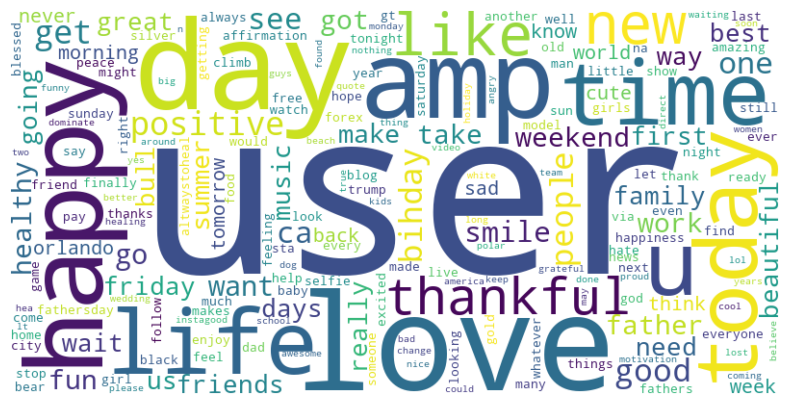

In [13]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

## Bar Plot

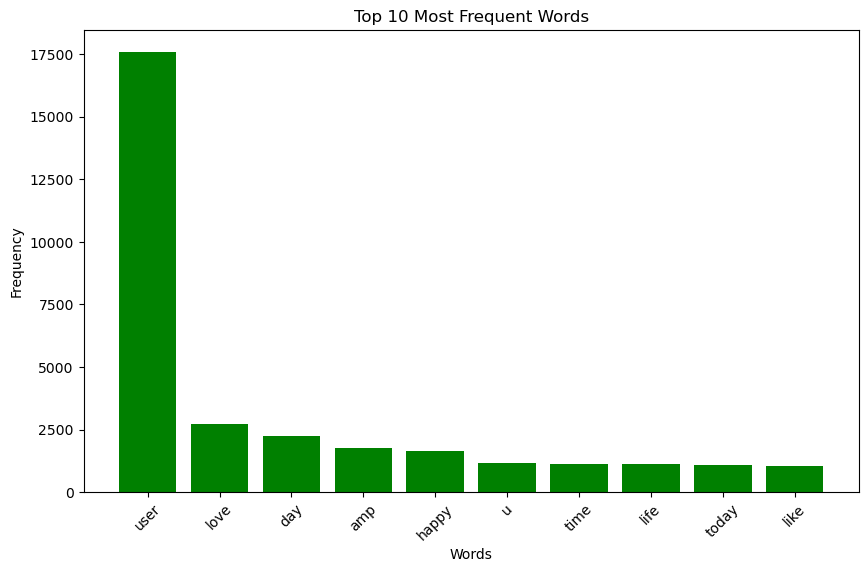

In [14]:
top_10_words = word_counts.most_common(10)
words, frequencies = zip(*top_10_words)
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies, color='green')
plt.title('Top 10 Most Frequent Words')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=45)  
plt.show()

# Interpretation and Findings

From the above plots we can observe that the dataset mostly contains words like happy, love, like, life, time, today etc. which means most of the tweets are positive tweets and contains information about particular time and day.